In [4]:
%pip install kagglehub -q


[notice] A new release of pip is available: 24.3.1 -> 25.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# Sobre o Dataset
## Context
This dataset encompasses images of various fruits and vegetables, providing a diverse collection for image recognition tasks. The included food items are:

* Fruits: Banana, Apple, Pear, Grapes, Orange, Kiwi, Watermelon, Pomegranate, Pineapple, Mango
* Vegetables: Cucumber, Carrot, Capsicum, Onion, Potato, Lemon, Tomato, Radish, Beetroot, Cabbage, Lettuce, Spinach, Soybean, Cauliflower, Bell Pepper, Chilli Pepper, Turnip, Corn, Sweetcorn, Sweet Potato, Paprika, Jalapeño, Ginger, Garlic, Peas, Eggplant

## Content
The dataset is organized into three main folders:

* Train: Contains 100 images per category.
* Test: Contains 10 images per category.
* Validation: Contains 10 images per category.

Each of these folders is subdivided into specific folders for each type of fruit and vegetable, containing respective images.

Total Size: 2.17GB

## Data Collection
The images in this dataset were sourced using Bing Image Search for a personal project focused on image recognition of food items. The creator does not hold the rights to any of the images included in this dataset. If you are the owner of any image and have concerns regarding its use, please contact the creator to request its removal. The creator will promptly comply with any such requests to ensure all legal obligations are met.

_Disclaimer_: Users of this dataset are responsible for ensuring that their use of the images complies with applicable copyright laws and regulations. The creator assumes no responsibility for any legal issues that may arise from the use of this dataset. It is recommended to use the dataset for educational and non-commercial purposes only and to seek legal counsel if you have specific concerns about copyright compliance.

## Inspiration
The primary motivation behind creating this dataset was to develop an application capable of recognizing food items from photographs. The application aims to suggest various recipes that can be prepared using the identified ingredients.

## Citation
>Kritik Seth, "Fruits and Vegetables Image Recognition Dataset," Kaggle 2020 [https://www.kaggle.com/kritikseth/fruit-and-vegetable-image-recognition]




In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kritikseth/fruit-and-vegetable-image-recognition")

print("Path to dataset files:", path)

/home/claudiosampaio/.pyenv/versions/.ml_aplicada1/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to dataset files: /home/claudiosampaio/.cache/kagglehub/datasets/kritikseth/fruit-and-vegetable-image-recognition/versions/8


In [6]:
%pip install tensorflow -q


[notice] A new release of pip is available: 24.3.1 -> 25.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os
import warnings  

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import matplotlib.image as mpimg

# Training, Test and Validation Datasets

In [ ]:
train_dir = path + '/train'
val_dir   = path + '/validation'
test_dir  = path + '/test'

# Configuração dos DataGenerators

In [9]:
train_datagen = ImageDataGenerator(
    rescale=1./255,          # Normalização de imagens (Já existia)
    rotation_range=20,       # Rotação aleatória de até 20%
    width_shift_range=0.1,   # Deslocamento horizontal de 10%
    height_shift_range=0.1,  # Deslocamento vertical de 10%
    shear_range=0.1,         # Cisalhamento (Inclinação)
    zoom_range=0.1,          # Zoom de 10%
    horizontal_flip=True,    # Inversão horizontal aleatória
    fill_mode='nearest'      # Modo de preenchimento
)

validation_datagen = ImageDataGenerator(rescale=1./255)

# Criação dos datasets de imagens

In [22]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred', 
    label_mode='categorical',
    image_size=(128, 128),
    batch_size=32)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels="inferred",
    label_mode="categorical",
    image_size=(128,128),
    batch_size=32
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels="inferred",
    label_mode="categorical",
    image_size=(128,128),
    batch_size=32
)

class_names = train_ds.class_names
print("Class Names:")
print(class_names)

Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.
Found 359 files belonging to 36 classes.
Class Names:
['apple', 'banana', 'beetroot', 'bell pepper', 'cabbage', 'capsicum', 'carrot', 'cauliflower', 'chilli pepper', 'corn', 'cucumber', 'eggplant', 'garlic', 'ginger', 'grapes', 'jalepeno', 'kiwi', 'lemon', 'lettuce', 'mango', 'onion', 'orange', 'paprika', 'pear', 'peas', 'pineapple', 'pomegranate', 'potato', 'raddish', 'soy beans', 'spinach', 'sweetcorn', 'sweetpotato', 'tomato', 'turnip', 'watermelon']


# Gera uma galeria da categoria das imagens

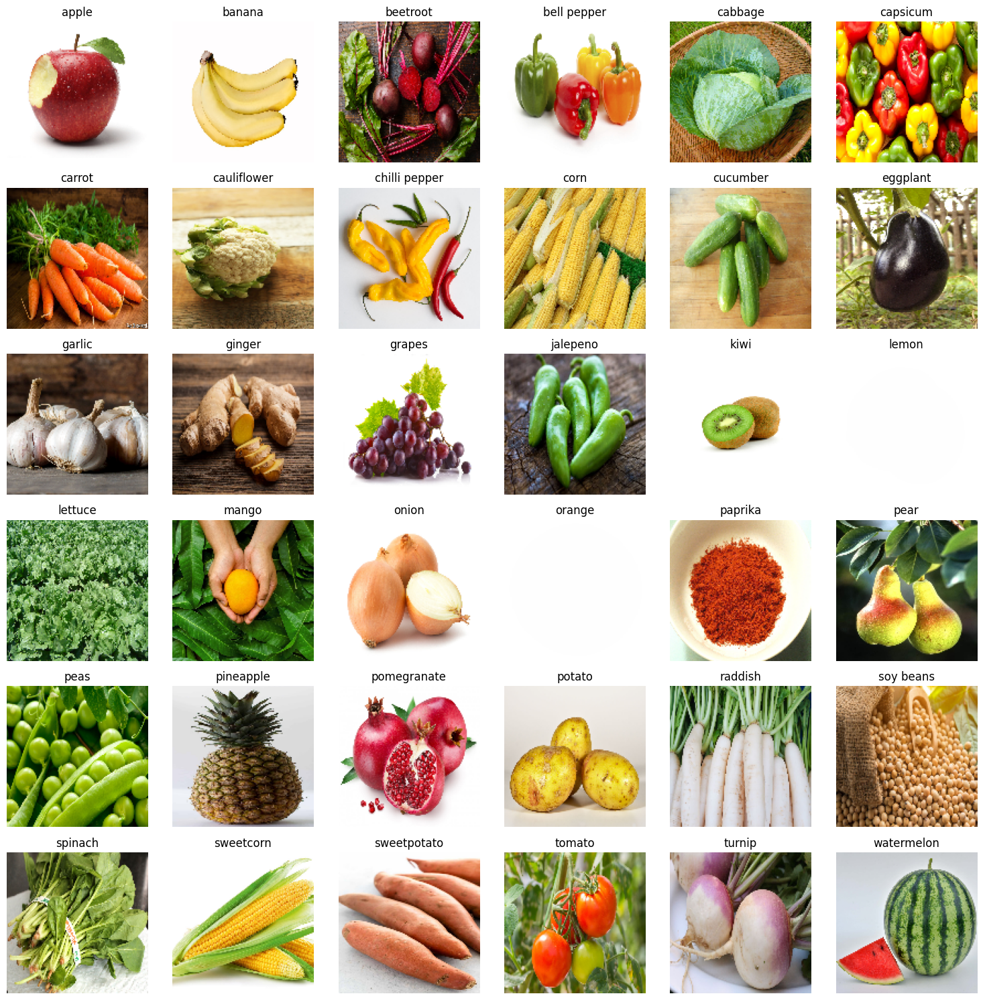

In [11]:
folders = sorted(os.listdir(train_dir)) # Ordenar os arquivos em ordem alfabética

num_classes = len(folders) # Quantas classes existem

plt.figure(figsize=(15, 15))

for i, folder in enumerate(folders):
    folder_path = os.path.join(train_dir, folder)
    
    if os.path.isdir(folder_path):
        # Ordenar os arquivos
        file_list = sorted(os.listdir(folder_path))
        
        if len(file_list) > 0:
            file_name = file_list[0] # Pega a primeira imagem da pasta
            img_path = os.path.join(folder_path, file_name)
            
            # Lê a imagem
            img = mpimg.imread(img_path)
            img = tf.image.resize(img, (128,128)).numpy().astype("uint8")

            # Desenha 1 item na galeria        
            plt.subplot(6, 6, i+1)
            plt.imshow(img)
            plt.title(folder)
            plt.axis("off")

plt.tight_layout()
plt.show()

# Gera uma galeria randomica com todas as imagens por categoria

In [12]:
import random

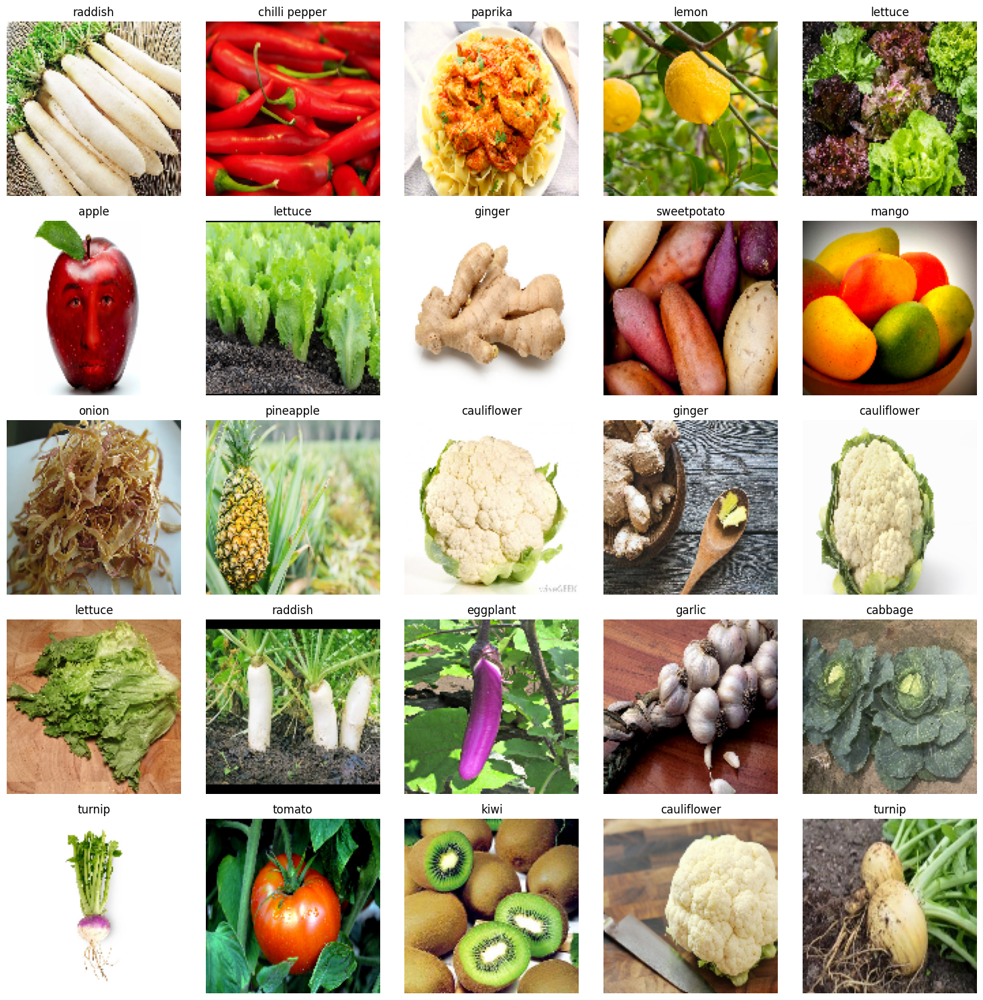

In [13]:
all_images = []
all_labels = []

# Coletar todas as imagens e seus rótulos de todo o conjunto de dados (dataset).
for folder in os.listdir(train_dir):
    folder_path = os.path.join(train_dir, folder)
    if os.path.isdir(folder_path):
        files = sorted(os.listdir(folder_path))
        for file in files:
            file_path = os.path.join(folder_path, file)
            try:
                img = mpimg.imread(file_path)
                img = tf.image.resize(img, (128,128)).numpy().astype("uint8")
                all_images.append(img)
                all_labels.append(folder)
            except:
                continue

randoms = random.sample(range(len(all_images)), 25)

plt.figure(figsize=(15, 15))
for i, idx in enumerate(randoms):
    plt.subplot(5, 5, i+1)
    plt.imshow(all_images[idx])
    plt.title(all_labels[idx])
    plt.axis("off")

plt.tight_layout()
plt.show()

# Distribuiçao das classes

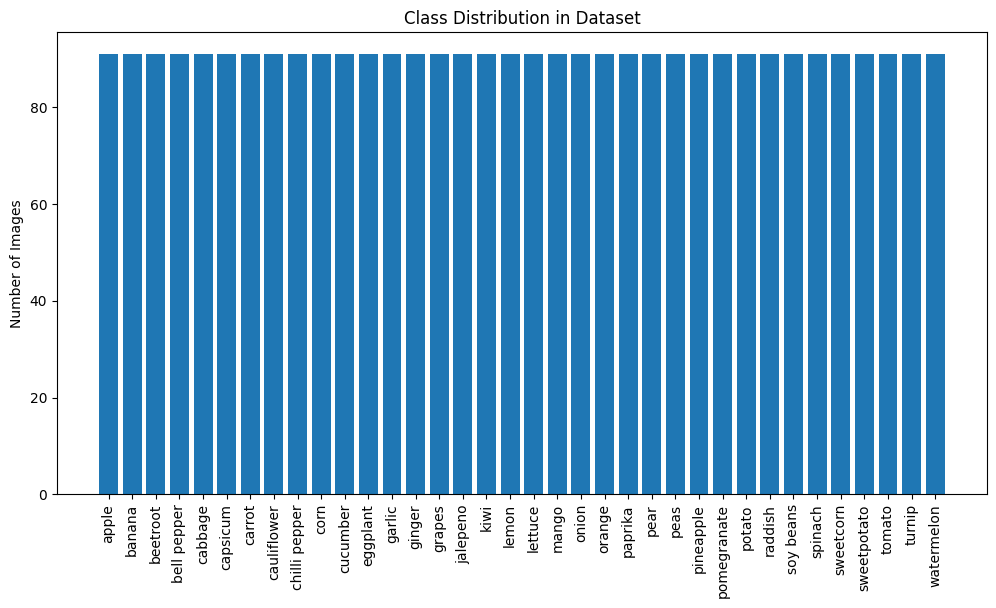

In [14]:
class_counts = {}

for folder in sorted(os.listdir(train_dir)):
    if os.path.isdir(folder_path):
        class_counts[folder] = len(os.listdir(folder_path))

df_counts = pd.DataFrame(list(class_counts.items()), columns=["Class", "Image_Count"])

plt.figure(figsize=(12,6))
plt.bar(df_counts["Class"], df_counts["Image_Count"])
plt.xticks(rotation=90)
plt.ylabel("Number of Images")
plt.title("Class Distribution in Dataset")
plt.show()

# Treinamento dos Modelos

In [15]:
from tensorflow.keras import layers, models

In [16]:
def cnn(optimizer="adam", filters=32, kernel_size=3, dropout_rate=0.5):
    model = models.Sequential([
        layers.Rescaling(1./255, input_shape=(128,128,3)), 
        
        layers.Conv2D(filters, (kernel_size, kernel_size), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        
        layers.Conv2D(filters*2, (kernel_size, kernel_size), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        
        layers.Conv2D(filters*4, (kernel_size, kernel_size), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Dropout(0.25), 
        
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(len(class_names), activation='softmax')
    ])
    
    model.compile(optimizer=optimizer,
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])
    return model

In [17]:
model = cnn()
model.summary()

/home/claudiosampaio/.pyenv/versions/.ml_aplicada1/lib/python3.12/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 36)             │         9,252 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,525,284 (24.89 MB)

 Trainable params: 6,525,284 (24.89 MB)

 Non-trainable params: 0 (0.00 B)

## Treinamento do modelo

In [19]:
history = model.fit(
    train_ds,
    epochs=5,
    validation_data=val_ds
)

Epoch 1/5


2025-10-11 14:06:07.754407: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:07.804540: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:07.845554: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:08.080175: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 6/98 ━━━━━━━━━━━━━━━━━━━━ 33s 366ms/step - accuracy: 0.2665 - loss: 2.5185

2025-10-11 14:06:10.247644: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:10.252216: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 8/98 ━━━━━━━━━━━━━━━━━━━━ 33s 378ms/step - accuracy: 0.2624 - loss: 2.4975

2025-10-11 14:06:11.042449: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


22/98 ━━━━━━━━━━━━━━━━━━━━ 28s 378ms/step - accuracy: 0.2592 - loss: 2.4326

2025-10-11 14:06:16.346355: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


26/98 ━━━━━━━━━━━━━━━━━━━━ 27s 378ms/step - accuracy: 0.2588 - loss: 2.4306

2025-10-11 14:06:17.860945: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


32/98 ━━━━━━━━━━━━━━━━━━━━ 25s 381ms/step - accuracy: 0.2607 - loss: 2.4233

2025-10-11 14:06:20.207368: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


44/98 ━━━━━━━━━━━━━━━━━━━━ 20s 380ms/step - accuracy: 0.2646 - loss: 2.4087

2025-10-11 14:06:24.783010: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


46/98 ━━━━━━━━━━━━━━━━━━━━ 19s 381ms/step - accuracy: 0.2651 - loss: 2.4063

2025-10-11 14:06:25.585005: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


47/98 ━━━━━━━━━━━━━━━━━━━━ 19s 381ms/step - accuracy: 0.2654 - loss: 2.4052

2025-10-11 14:06:25.928650: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


59/98 ━━━━━━━━━━━━━━━━━━━━ 14s 382ms/step - accuracy: 0.2680 - loss: 2.3953

2025-10-11 14:06:30.542461: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


62/98 ━━━━━━━━━━━━━━━━━━━━ 13s 381ms/step - accuracy: 0.2687 - loss: 2.3929

2025-10-11 14:06:31.635079: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


67/98 ━━━━━━━━━━━━━━━━━━━━ 11s 381ms/step - accuracy: 0.2701 - loss: 2.3886

2025-10-11 14:06:33.526232: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:33.598288: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


75/98 ━━━━━━━━━━━━━━━━━━━━ 8s 380ms/step - accuracy: 0.2720 - loss: 2.3827

2025-10-11 14:06:36.543341: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


79/98 ━━━━━━━━━━━━━━━━━━━━ 7s 379ms/step - accuracy: 0.2730 - loss: 2.3800

2025-10-11 14:06:37.968349: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:37.970568: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


88/98 ━━━━━━━━━━━━━━━━━━━━ 3s 379ms/step - accuracy: 0.2749 - loss: 2.3761

2025-10-11 14:06:41.371532: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:41.400495: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


89/98 ━━━━━━━━━━━━━━━━━━━━ 3s 380ms/step - accuracy: 0.2751 - loss: 2.3757

2025-10-11 14:06:41.843666: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.2769 - loss: 2.3724

2025-10-11 14:06:44.798436: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:45.368688: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 40s 400ms/step - accuracy: 0.2982 - loss: 2.3330 - val_accuracy: 0.5071 - val_loss: 1.6124
Epoch 2/5


2025-10-11 14:06:47.592508: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 1/98 ━━━━━━━━━━━━━━━━━━━━ 1:21 842ms/step - accuracy: 0.4062 - loss: 1.9770

2025-10-11 14:06:48.038931: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 7/98 ━━━━━━━━━━━━━━━━━━━━ 33s 367ms/step - accuracy: 0.3701 - loss: 2.0712

2025-10-11 14:06:50.246629: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 9/98 ━━━━━━━━━━━━━━━━━━━━ 33s 376ms/step - accuracy: 0.3615 - loss: 2.0915

2025-10-11 14:06:51.054452: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:51.171577: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


12/98 ━━━━━━━━━━━━━━━━━━━━ 32s 382ms/step - accuracy: 0.3555 - loss: 2.1043

2025-10-11 14:06:52.238341: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:06:52.269929: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


13/98 ━━━━━━━━━━━━━━━━━━━━ 32s 380ms/step - accuracy: 0.3533 - loss: 2.1066

2025-10-11 14:06:52.603021: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


18/98 ━━━━━━━━━━━━━━━━━━━━ 30s 380ms/step - accuracy: 0.3435 - loss: 2.1237

2025-10-11 14:06:54.493388: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


29/98 ━━━━━━━━━━━━━━━━━━━━ 26s 379ms/step - accuracy: 0.3395 - loss: 2.1387

2025-10-11 14:06:58.667278: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


42/98 ━━━━━━━━━━━━━━━━━━━━ 21s 377ms/step - accuracy: 0.3426 - loss: 2.1406

2025-10-11 14:07:03.508473: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


43/98 ━━━━━━━━━━━━━━━━━━━━ 20s 378ms/step - accuracy: 0.3429 - loss: 2.1404

2025-10-11 14:07:03.919157: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


44/98 ━━━━━━━━━━━━━━━━━━━━ 20s 378ms/step - accuracy: 0.3432 - loss: 2.1401

2025-10-11 14:07:04.291797: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


50/98 ━━━━━━━━━━━━━━━━━━━━ 18s 380ms/step - accuracy: 0.3454 - loss: 2.1387

2025-10-11 14:07:06.670275: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


54/98 ━━━━━━━━━━━━━━━━━━━━ 16s 380ms/step - accuracy: 0.3465 - loss: 2.1392

2025-10-11 14:07:08.236066: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


57/98 ━━━━━━━━━━━━━━━━━━━━ 15s 380ms/step - accuracy: 0.3473 - loss: 2.1390

2025-10-11 14:07:09.303073: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


60/98 ━━━━━━━━━━━━━━━━━━━━ 14s 379ms/step - accuracy: 0.3480 - loss: 2.1387

2025-10-11 14:07:10.425836: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


68/98 ━━━━━━━━━━━━━━━━━━━━ 11s 378ms/step - accuracy: 0.3500 - loss: 2.1365

2025-10-11 14:07:13.330543: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


73/98 ━━━━━━━━━━━━━━━━━━━━ 9s 378ms/step - accuracy: 0.3509 - loss: 2.1353

2025-10-11 14:07:15.240712: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


78/98 ━━━━━━━━━━━━━━━━━━━━ 7s 378ms/step - accuracy: 0.3518 - loss: 2.1340

2025-10-11 14:07:17.113327: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


79/98 ━━━━━━━━━━━━━━━━━━━━ 7s 378ms/step - accuracy: 0.3519 - loss: 2.1338

2025-10-11 14:07:17.538283: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


83/98 ━━━━━━━━━━━━━━━━━━━━ 5s 378ms/step - accuracy: 0.3524 - loss: 2.1333

2025-10-11 14:07:19.096465: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


84/98 ━━━━━━━━━━━━━━━━━━━━ 5s 378ms/step - accuracy: 0.3525 - loss: 2.1333

2025-10-11 14:07:19.470976: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.3535 - loss: 2.1336

2025-10-11 14:07:26.024555: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:07:26.077581: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 40s 399ms/step - accuracy: 0.3586 - loss: 2.1350 - val_accuracy: 0.6325 - val_loss: 1.4342
Epoch 3/5


2025-10-11 14:07:27.336571: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 3/98 ━━━━━━━━━━━━━━━━━━━━ 41s 441ms/step - accuracy: 0.3420 - loss: 1.9940

2025-10-11 14:07:28.524362: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 5/98 ━━━━━━━━━━━━━━━━━━━━ 38s 418ms/step - accuracy: 0.3643 - loss: 1.9678

2025-10-11 14:07:29.338163: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 7/98 ━━━━━━━━━━━━━━━━━━━━ 37s 409ms/step - accuracy: 0.3719 - loss: 1.9644

2025-10-11 14:07:30.083357: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:07:30.098109: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 9/98 ━━━━━━━━━━━━━━━━━━━━ 36s 409ms/step - accuracy: 0.3742 - loss: 1.9681

2025-10-11 14:07:30.917863: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


11/98 ━━━━━━━━━━━━━━━━━━━━ 34s 402ms/step - accuracy: 0.3786 - loss: 1.9670

2025-10-11 14:07:31.625139: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


17/98 ━━━━━━━━━━━━━━━━━━━━ 31s 385ms/step - accuracy: 0.3863 - loss: 1.9769

2025-10-11 14:07:33.783559: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


19/98 ━━━━━━━━━━━━━━━━━━━━ 30s 386ms/step - accuracy: 0.3876 - loss: 1.9818

2025-10-11 14:07:34.639390: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


34/98 ━━━━━━━━━━━━━━━━━━━━ 24s 385ms/step - accuracy: 0.3993 - loss: 1.9950

2025-10-11 14:07:40.323124: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


42/98 ━━━━━━━━━━━━━━━━━━━━ 21s 378ms/step - accuracy: 0.4025 - loss: 1.9937

2025-10-11 14:07:43.119080: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


47/98 ━━━━━━━━━━━━━━━━━━━━ 19s 378ms/step - accuracy: 0.4047 - loss: 1.9897

2025-10-11 14:07:44.995939: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


49/98 ━━━━━━━━━━━━━━━━━━━━ 18s 377ms/step - accuracy: 0.4056 - loss: 1.9882

2025-10-11 14:07:45.722598: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


51/98 ━━━━━━━━━━━━━━━━━━━━ 17s 379ms/step - accuracy: 0.4064 - loss: 1.9868

2025-10-11 14:07:46.568967: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


53/98 ━━━━━━━━━━━━━━━━━━━━ 17s 379ms/step - accuracy: 0.4072 - loss: 1.9854

2025-10-11 14:07:47.333038: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:07:47.344765: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


57/98 ━━━━━━━━━━━━━━━━━━━━ 15s 382ms/step - accuracy: 0.4087 - loss: 1.9822

2025-10-11 14:07:49.071777: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


68/98 ━━━━━━━━━━━━━━━━━━━━ 11s 382ms/step - accuracy: 0.4110 - loss: 1.9757

2025-10-11 14:07:53.212718: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:07:53.213606: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


69/98 ━━━━━━━━━━━━━━━━━━━━ 11s 382ms/step - accuracy: 0.4111 - loss: 1.9751

2025-10-11 14:07:53.620692: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


70/98 ━━━━━━━━━━━━━━━━━━━━ 10s 383ms/step - accuracy: 0.4113 - loss: 1.9745

2025-10-11 14:07:54.131453: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


76/98 ━━━━━━━━━━━━━━━━━━━━ 8s 383ms/step - accuracy: 0.4123 - loss: 1.9713

2025-10-11 14:07:56.414831: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


85/98 ━━━━━━━━━━━━━━━━━━━━ 4s 381ms/step - accuracy: 0.4137 - loss: 1.9665

2025-10-11 14:07:59.686027: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - accuracy: 0.4154 - loss: 1.9602

2025-10-11 14:08:03.836030: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:08:03.902110: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 39s 398ms/step - accuracy: 0.4276 - loss: 1.9207 - val_accuracy: 0.7664 - val_loss: 1.0437
Epoch 4/5


2025-10-11 14:08:06.323703: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:08:06.661457: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 2/98 ━━━━━━━━━━━━━━━━━━━━ 34s 357ms/step - accuracy: 0.4219 - loss: 1.7881 

2025-10-11 14:08:07.449385: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 7/98 ━━━━━━━━━━━━━━━━━━━━ 33s 368ms/step - accuracy: 0.4811 - loss: 1.7167

2025-10-11 14:08:09.311112: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:08:09.360596: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 9/98 ━━━━━━━━━━━━━━━━━━━━ 32s 362ms/step - accuracy: 0.4886 - loss: 1.7096

2025-10-11 14:08:10.038126: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


13/98 ━━━━━━━━━━━━━━━━━━━━ 31s 373ms/step - accuracy: 0.4953 - loss: 1.6951

2025-10-11 14:08:11.581756: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


20/98 ━━━━━━━━━━━━━━━━━━━━ 28s 371ms/step - accuracy: 0.4978 - loss: 1.6988

2025-10-11 14:08:14.139694: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


22/98 ━━━━━━━━━━━━━━━━━━━━ 28s 373ms/step - accuracy: 0.4969 - loss: 1.7007

2025-10-11 14:08:14.953333: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


45/98 ━━━━━━━━━━━━━━━━━━━━ 19s 376ms/step - accuracy: 0.4922 - loss: 1.7186

2025-10-11 14:08:23.622749: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


46/98 ━━━━━━━━━━━━━━━━━━━━ 19s 376ms/step - accuracy: 0.4923 - loss: 1.7179

2025-10-11 14:08:24.028896: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


49/98 ━━━━━━━━━━━━━━━━━━━━ 18s 378ms/step - accuracy: 0.4926 - loss: 1.7165

2025-10-11 14:08:25.277346: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


52/98 ━━━━━━━━━━━━━━━━━━━━ 17s 379ms/step - accuracy: 0.4926 - loss: 1.7154

2025-10-11 14:08:26.471193: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


53/98 ━━━━━━━━━━━━━━━━━━━━ 17s 380ms/step - accuracy: 0.4927 - loss: 1.7150

2025-10-11 14:08:26.846221: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


55/98 ━━━━━━━━━━━━━━━━━━━━ 16s 381ms/step - accuracy: 0.4927 - loss: 1.7142

2025-10-11 14:08:27.718470: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


57/98 ━━━━━━━━━━━━━━━━━━━━ 15s 381ms/step - accuracy: 0.4927 - loss: 1.7132

2025-10-11 14:08:28.472333: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


66/98 ━━━━━━━━━━━━━━━━━━━━ 12s 379ms/step - accuracy: 0.4927 - loss: 1.7084

2025-10-11 14:08:31.753346: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


67/98 ━━━━━━━━━━━━━━━━━━━━ 11s 379ms/step - accuracy: 0.4927 - loss: 1.7081

2025-10-11 14:08:32.150494: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


76/98 ━━━━━━━━━━━━━━━━━━━━ 8s 380ms/step - accuracy: 0.4921 - loss: 1.7052

2025-10-11 14:08:35.663412: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


78/98 ━━━━━━━━━━━━━━━━━━━━ 7s 380ms/step - accuracy: 0.4921 - loss: 1.7045

2025-10-11 14:08:36.438643: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


79/98 ━━━━━━━━━━━━━━━━━━━━ 7s 381ms/step - accuracy: 0.4921 - loss: 1.7041

2025-10-11 14:08:36.821711: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


80/98 ━━━━━━━━━━━━━━━━━━━━ 6s 381ms/step - accuracy: 0.4921 - loss: 1.7038

2025-10-11 14:08:37.205181: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


84/98 ━━━━━━━━━━━━━━━━━━━━ 5s 381ms/step - accuracy: 0.4920 - loss: 1.7030

2025-10-11 14:08:38.785516: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.4919 - loss: 1.7001

2025-10-11 14:08:43.828105: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:08:45.057730: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 40s 400ms/step - accuracy: 0.4899 - loss: 1.6861 - val_accuracy: 0.7806 - val_loss: 0.8761
Epoch 5/5


2025-10-11 14:08:46.112625: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:08:46.144347: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 1/98 ━━━━━━━━━━━━━━━━━━━━ 1:42 1s/step - accuracy: 0.5625 - loss: 1.3604

2025-10-11 14:08:46.794750: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:08:46.923698: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 6/98 ━━━━━━━━━━━━━━━━━━━━ 35s 385ms/step - accuracy: 0.5683 - loss: 1.4598

2025-10-11 14:08:48.882054: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


 7/98 ━━━━━━━━━━━━━━━━━━━━ 34s 380ms/step - accuracy: 0.5617 - loss: 1.4781

2025-10-11 14:08:49.231233: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


12/98 ━━━━━━━━━━━━━━━━━━━━ 33s 389ms/step - accuracy: 0.5478 - loss: 1.5225

2025-10-11 14:08:51.230987: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


16/98 ━━━━━━━━━━━━━━━━━━━━ 31s 382ms/step - accuracy: 0.5412 - loss: 1.5353

2025-10-11 14:08:52.640451: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


36/98 ━━━━━━━━━━━━━━━━━━━━ 23s 377ms/step - accuracy: 0.5367 - loss: 1.5492

2025-10-11 14:09:00.166243: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


39/98 ━━━━━━━━━━━━━━━━━━━━ 22s 379ms/step - accuracy: 0.5372 - loss: 1.5483

2025-10-11 14:09:01.316852: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


42/98 ━━━━━━━━━━━━━━━━━━━━ 21s 378ms/step - accuracy: 0.5379 - loss: 1.5462

2025-10-11 14:09:02.411501: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


44/98 ━━━━━━━━━━━━━━━━━━━━ 20s 377ms/step - accuracy: 0.5386 - loss: 1.5443

2025-10-11 14:09:03.139336: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:09:03.155269: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


54/98 ━━━━━━━━━━━━━━━━━━━━ 16s 379ms/step - accuracy: 0.5421 - loss: 1.5308

2025-10-11 14:09:07.039763: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


55/98 ━━━━━━━━━━━━━━━━━━━━ 16s 380ms/step - accuracy: 0.5425 - loss: 1.5293

2025-10-11 14:09:07.483220: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


57/98 ━━━━━━━━━━━━━━━━━━━━ 15s 380ms/step - accuracy: 0.5433 - loss: 1.5263

2025-10-11 14:09:08.231076: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


65/98 ━━━━━━━━━━━━━━━━━━━━ 12s 378ms/step - accuracy: 0.5454 - loss: 1.5169

2025-10-11 14:09:11.092871: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


66/98 ━━━━━━━━━━━━━━━━━━━━ 12s 377ms/step - accuracy: 0.5456 - loss: 1.5158

2025-10-11 14:09:11.486532: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


67/98 ━━━━━━━━━━━━━━━━━━━━ 11s 378ms/step - accuracy: 0.5458 - loss: 1.5147

2025-10-11 14:09:11.875409: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


70/98 ━━━━━━━━━━━━━━━━━━━━ 10s 379ms/step - accuracy: 0.5464 - loss: 1.5119

2025-10-11 14:09:13.151980: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


76/98 ━━━━━━━━━━━━━━━━━━━━ 8s 380ms/step - accuracy: 0.5472 - loss: 1.5075

2025-10-11 14:09:15.443198: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


80/98 ━━━━━━━━━━━━━━━━━━━━ 6s 380ms/step - accuracy: 0.5476 - loss: 1.5055

2025-10-11 14:09:17.001975: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


85/98 ━━━━━━━━━━━━━━━━━━━━ 4s 380ms/step - accuracy: 0.5479 - loss: 1.5041

2025-10-11 14:09:18.891171: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - accuracy: 0.5487 - loss: 1.5012

2025-10-11 14:09:23.429933: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:09:24.069299: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


98/98 ━━━━━━━━━━━━━━━━━━━━ 40s 397ms/step - accuracy: 0.5525 - loss: 1.4875 - val_accuracy: 0.8348 - val_loss: 0.7284


## Acurácia vs Perda

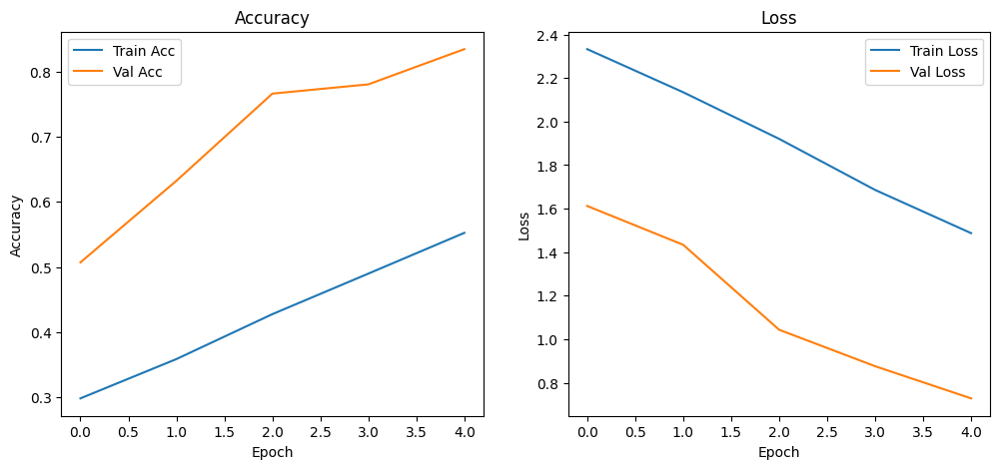

In [20]:
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history["accuracy"], label="Train Acc")
plt.plot(history.history["val_accuracy"], label="Val Acc")
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"], label="Val Loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

## Avaliação do dataset de teste

In [23]:
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

 3/12 ━━━━━━━━━━━━━━━━━━━━ 3s 426ms/step - accuracy: 0.8212 - loss: 0.6990

2025-10-11 14:14:28.024170: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:14:28.182480: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.8357 - loss: 0.7242
Test Loss: 0.7242
Test Accuracy: 0.8357


### Resultado do classificador (Previsão vs Real)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


2025-10-11 14:26:04.380632: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


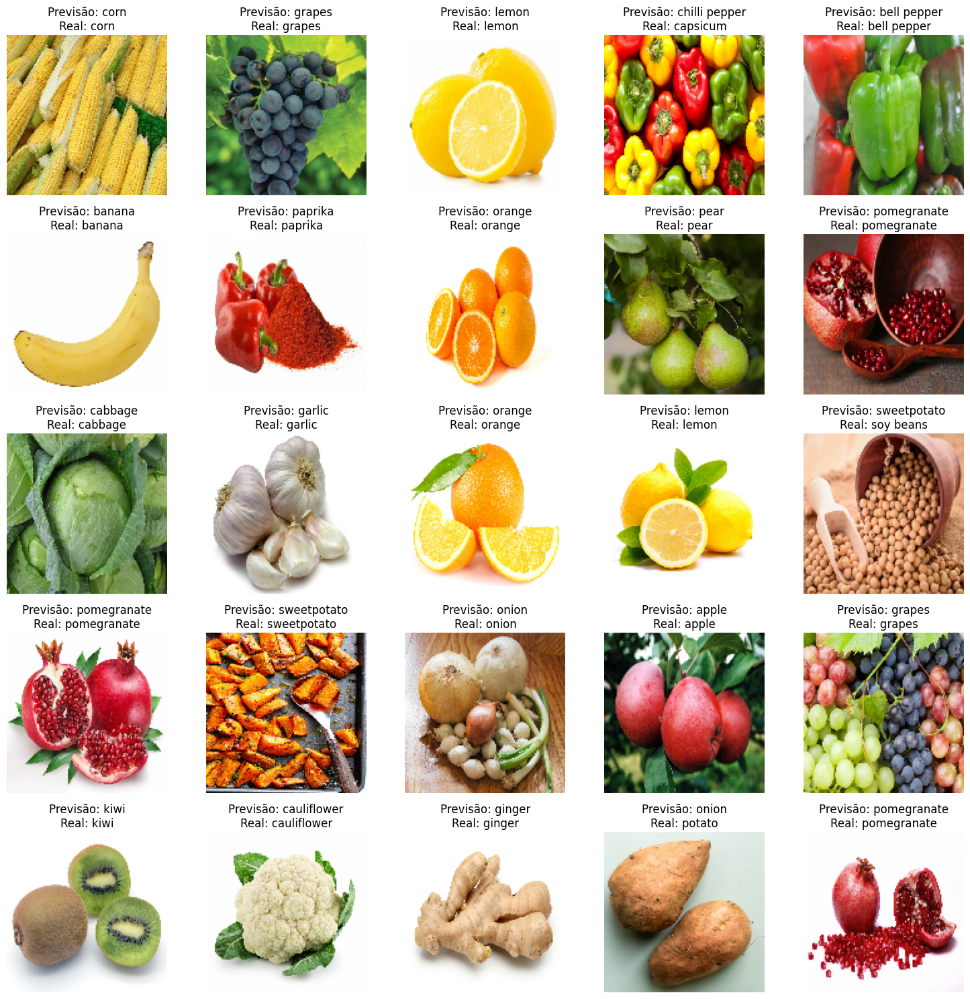

In [24]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    preds = model.predict(images)
    preds = tf.argmax(preds, axis=1)
    true_labels = tf.argmax(labels, axis=1)

    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Previsão: {class_names[preds[i]]}\nReal: {class_names[true_labels[i]]}")
        plt.axis("off")
plt.tight_layout()
plt.show()

### Matriz de Confusão

2025-10-11 14:33:26.270459: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile
2025-10-11 14:33:27.143226: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


<Figure size 6000x6000 with 0 Axes>

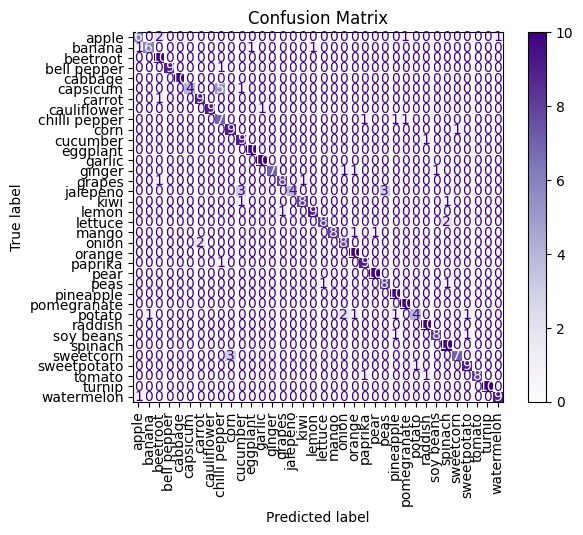

In [28]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Obter imagens e rótulos dos dados de teste
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(60, 60))
disp.plot(cmap="Purples", xticks_rotation=90, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# Salvando Modelo

In [31]:
nome_modelo = 'frutas_vegetais_tensorflow_cnn.joblib'

In [32]:
import joblib

joblib.dump(model, nome_modelo)

print(f"Modelo salvo: {nome_modelo}")

Modelo salvo: frutas_vegetais_tensorflow_cnn.joblib


# Carregar e usar Modelo Salvo

In [56]:
import joblib

loaded_model = joblib.load(nome_modelo)
print(f"Modelo carregado: {nome_modelo}")

Modelo carregado: frutas_vegetais_tensorflow_cnn.joblib


## Teste de classificação

2025-10-11 15:51:34.279808: W tensorflow/core/lib/png/png_io.cc:95] PNG warning: iCCP: known incorrect sRGB profile


Formato do lote de imagens: (32, 128, 128, 3)
Formato do lote de rótulos: (32, 36)


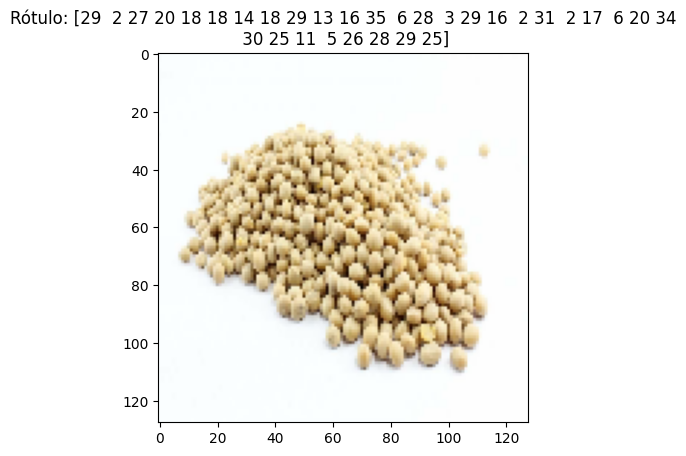

In [69]:
# Pega o primeiro lote do dataset de teste
primeiro_lote = test_ds.take(1)

# Itera sobre este novo dataset (que só tem um elemento)
for imagens, rotulos in primeiro_lote:
  # 'imagens' é um tensor com um lote de imagens
  # 'rotulos' é um tensor com os rótulos correspondentes
  
  print('Formato do lote de imagens:', imagens.shape)
  print('Formato do lote de rótulos:', rotulos.shape)

  classe = tf.argmax(rotulos.numpy(), axis=1)
  
  # Você pode, por exemplo, exibir a primeira imagem do lote
  import matplotlib.pyplot as plt
  plt.imshow(imagens[0].numpy().astype("uint8"))
  plt.title(f"Rótulo: {classe}")
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
tf.Tensor([11], shape=(1,), dtype=int64)


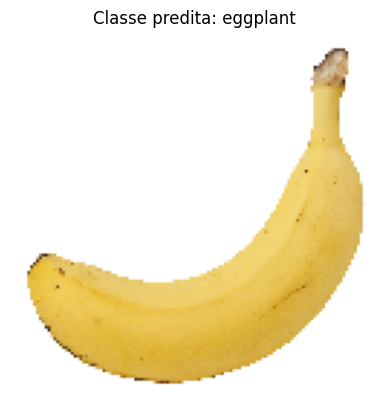

In [ ]:
# Carrega a imgem do arquivo com as mesmas dimenções do treinamento
image = tf.keras.utils.load_img(test_dir + '/banana/Image_3.jpg', target_size=(128,128))
# Gera uma matriz da imagem
image_array = tf.keras.utils.img_to_array(image)
# Redimenciona o lote de imagens
image_batch = np.expand_dims(image_array,axis=0)
# Rescala a imagem na mesma escala do treinamento
image_batch = image_batch / 255.0

preds = loaded_model.predict(image_batch)
# Pega o índice da classe com a maior probabilidade (a classe prevista pelo modelo)
preds = tf.argmax(preds, axis=1)
print(preds)

plt.imshow(image, cmap='gray')
plt.title(f'Classe predita: {class_names[preds.numpy()[0]]}')
plt.axis('off')
plt.show()